## **Testing LightNet using Coffee roasting dataset**

#### We'll be testing LightNet using the coffee roasting example.

#### "The results show that **LightNet** is able to reproduce results expected of a neural network quite well with a score of .965 on the testing set."

In [2]:
import sys
sys.path.append("D:\Development\data_science\ML_algorithms\coursera-2\Week-2\Computational_graphs")

In [4]:
import LightNet as ln
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Normalization
import lab_coffee_utils as lcu

#### Loading the coffee roating dataset and visualising it

In [5]:
X,Y=lcu.load_coffee_data()
print(X.shape, Y.shape)

# X is the input array, while Y is the output array 
# X[0] is the temprature, X[1] is the duration

(200, 2) (200, 1)


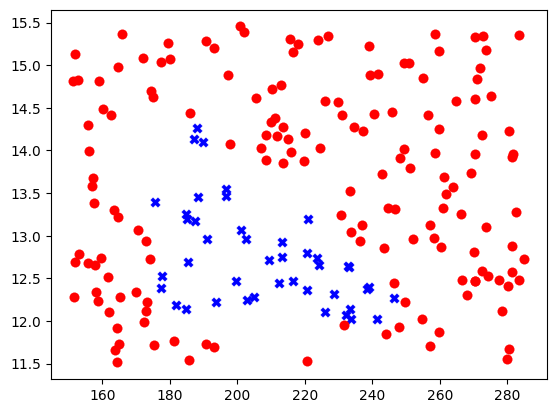

In [6]:
plt.scatter(X[Y[:,0]==1,0], X[Y[:,0]==1,1], marker='X', color='b', linewidths=.1, s=50)
plt.scatter(X[Y[:,0]==0,0], X[Y[:,0]==0,1], marker='o', color='r', linewidths=.1, s=50)
plt.show()

#### Normalising and tiling the dataset

In [8]:
norm=Normalization(axis=1) # norm is the normalisation layer object
norm.adapt(X) # adapt function calculates the value of mean and variance of each column(axis is set to be 0)
Xn=norm(X)

In [9]:
Xt=np.tile(Xn,(100,1))
Yt=np.tile(Y, (100,1))

#### Building the model

In [10]:
model=ln.Network([(2,),
                  ln.Layer(units=3, activation='sigmoid', label='L1'),
                  ln.Layer(units=1, activation='sigmoid', label='L2')])

In [12]:
model.get_weights()     #weights before training(initialised wieghts)

L1
Weights: 
[[-1.04402071  0.11515407 -0.88986571]
 [-0.31688532  1.52353184  0.38231415]
 [ 0.51352016  0.01992956  0.70101597]]
L2
Weights: 
[[-0.6593801  -1.09579358 -0.19077824  2.12273612]]


In [13]:
model.train(Xt, Yt, 10, .01)

Node: data=[0.2525], label='Loss', op='['BCE']'
Node: data=[1.9400], label='Loss', op='['BCE']'
Node: data=[1.2419], label='Loss', op='['BCE']'
Node: data=[1.6802], label='Loss', op='['BCE']'
Node: data=[0.3918], label='Loss', op='['BCE']'
Node: data=[0.1828], label='Loss', op='['BCE']'
Node: data=[1.1975], label='Loss', op='['BCE']'
Node: data=[1.2076], label='Loss', op='['BCE']'
Node: data=[1.3552], label='Loss', op='['BCE']'
Node: data=[0.2146], label='Loss', op='['BCE']'
Node: data=[0.3347], label='Loss', op='['BCE']'
Node: data=[1.2586], label='Loss', op='['BCE']'
Node: data=[1.0093], label='Loss', op='['BCE']'
Node: data=[1.1492], label='Loss', op='['BCE']'
Node: data=[1.5425], label='Loss', op='['BCE']'
Node: data=[0.9487], label='Loss', op='['BCE']'
Node: data=[1.1127], label='Loss', op='['BCE']'
Node: data=[1.4738], label='Loss', op='['BCE']'
Node: data=[1.1951], label='Loss', op='['BCE']'
Node: data=[1.5018], label='Loss', op='['BCE']'
Node: data=[1.2957], label='Loss', op='[

In [15]:
X_test = np.array([[200,13.9],[200,17]])
X_testn=norm(X_test) #normalising the test data
a1=model(X_testn[0])
a2=model(X_testn[1])
print(a1)   #expected output 1
print(a2)   #expected output 0

Node: data=[0.6804], label='I: L3', op='['buf']'
Node: data=[0.0027], label='I: L3', op='['buf']'


In [16]:
model.get_weights()     #weights after training

L1
Weights: 
[[-6.04530569 -0.31118836 -6.83399177]
 [ 6.7882517   6.08616961  0.07553669]
 [-0.93442689  3.50430965  3.86771262]]
L2
Weights: 
[[ -9.57777404 -10.61697439   5.32544904  -0.55348168]]


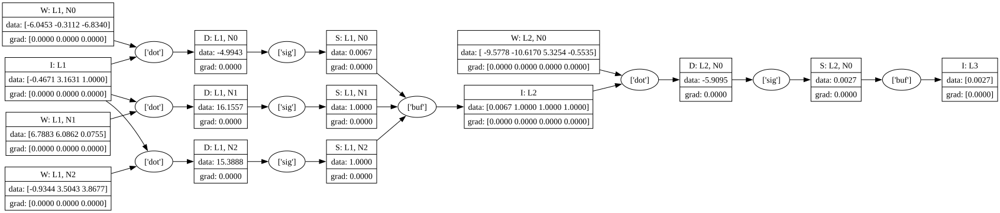

In [19]:
model.draw()

In [17]:
w1=model.layers[1].get_weights()
w1

array([[-6.04530569, -0.31118836, -6.83399177],
       [ 6.7882517 ,  6.08616961,  0.07553669],
       [-0.93442689,  3.50430965,  3.86771262]])

#### Visualising the desicion boundries created by the network

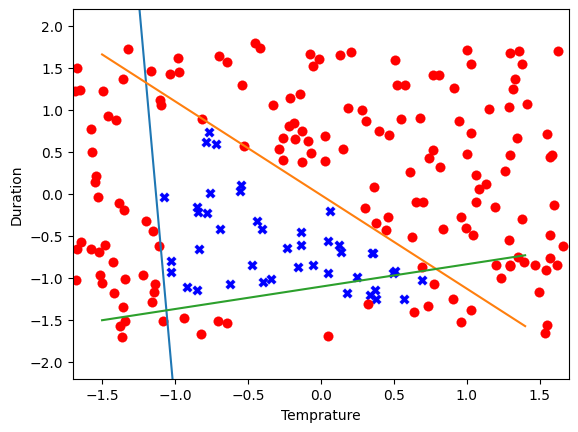

In [37]:
Xp=np.arange(-1.5,1.5,.1, dtype=float)
Xp1=np.arange(-.5,.5,.01, dtype=float)

Y0= -(Xp*w1[0][0])/w1[0][1]-(w1[0][2]/w1[0][1])
Y1= -(Xp*w1[1][0])/w1[1][1]-(w1[1][2]/w1[1][1])
Y2= -(Xp*w1[2][0])/w1[2][1]-(w1[2][2]/w1[2][1])
Xn2=np.array(Xn) # Xn is a tensor while Xn2 is a numpy array, this conversion is important
plt.scatter(Xn2[Y[:,0]==1,0], Xn2[Y[:,0]==1,1], marker='X', color='b', linewidths=.1, s=50)
plt.scatter(Xn2[Y[:,0]==0,0], Xn2[Y[:,0]==0,1], marker='o', color='r', linewidths=.1, s=50)
plt.plot(Xp,Y0)
plt.plot(Xp,Y1)
plt.plot(Xp, Y2)
plt.xlabel('Temprature')
plt.ylabel('Duration')
plt.xlim(-1.7,1.7)
plt.ylim(-2.2,2.2)
plt.show()

In [39]:
model.score(Xt, Yt)

0.965